# Aggregate Rollout Diagnostics — All 12 Models

This notebook aggregates prediction-error statistics **across every trial,
window, and rollout** in each of the 12 recursive rollout result files (as
opposed to `visualization.ipynb`, which inspects one single rollout at a
time).

**The 12 models** are every combination of:
- **case**: `multi` vs `single`
- **history frames**: `9`, `24`, `49`
- **target mouse id**: `0`, `1`

(2 × 3 × 2 = 12), exactly matching `rollout_result_paths` from
`visualization.ipynb`.

For each section below, one figure is produced containing a **grid of 12
subplots — one per model** — so all models can be compared side by side, in
this fixed order:

1. Mean RMSE per frame, averaged over all rollouts
2. Average prediction error by joint
3. Prediction error by distance
4. Prediction error by velocity
5. Prediction error by acceleration
6. Prediction error by behavior class / annotation
7. Prediction error by heading angle

**Note on "per frame" (section 1):** rollouts from different trials/windows
start at different absolute video frames, so raw `target_t` values don't
line up across rollouts. To average "frame by frame" as requested, frames
are aligned by their **position within the rollout** (1 = first predicted
frame, 2 = second predicted frame, ...) — i.e. the prediction-horizon step
— and the RMSE at each step is averaged across every rollout of that
model. So "1 point" for a model at step *k* = the mean RMSE of the *k*-th
predicted frame, taken over every rollout of that model.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from collections import defaultdict

from Tools.Utils import calculate_mouse_centers, calculate_mouse_distance


def load_task1_data(data_path):
    """
    Load data for task 1:
        The vocabulary tells you how to map behavior names to class ids;
        it is the same for all sequences in this dataset.
    """
    data_dict = np.load(data_path, allow_pickle=True).item()
    dataset = data_dict['annotator-id_0']
    # Get any sequence key.
    sequence_id = list(data_dict['annotator-id_0'].keys())[0]
    vocabulary = data_dict['annotator-id_0'][sequence_id]['metadata']['vocab']
    return dataset, vocabulary


# Only the behavior vocabulary is needed here, to turn the integer
# annotation ids stored in each rollout into class names such as
# "attack" / "mount" / "investigation" / "other".
training_data, vocab = load_task1_data('./Caltech/calms21_task1_train_distance_lt_330.npy')
number_to_class = {i: s for i, s in enumerate(vocab)}

JOINT_NAMES = ["nose", "ear_L", "ear_R", "neck", "hip_L", "hip_R", "tail"]


## Rollout files for all 12 models

In [2]:
# 9 history frames
multi_predict_frame_9_mouse_0_path = Path(
    "Model/asymmetric_pose_case/runs/20260718_160650_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_0_hist_9_stride_1.npz"
)
multi_predict_frame_9_mouse_1_path = Path(
    "Model/asymmetric_pose_case/runs/20260718_160650_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_1_hist_9_stride_1.npz"
)
single_predict_frame_9_mouse_0_path = Path(
    "Model/asymmetric_pose_case/runs/20260720_081141_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_0_hist_9_stride_1.npz"
)
single_predict_frame_9_mouse_1_path = Path(
    "Model/asymmetric_pose_case/runs/20260720_081141_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_1_hist_9_stride_1.npz"
)

# 24 history frames
multi_predict_frame_24_mouse_0_path = Path(
    "Model/asymmetric_pose_case/runs/20260722_150928_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_0_hist_24_stride_1.npz"
)
multi_predict_frame_24_mouse_1_path = Path(
    "Model/asymmetric_pose_case/runs/20260722_150928_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_1_hist_24_stride_1.npz"
)
single_predict_frame_24_mouse_0_path = Path(
    "Model/asymmetric_pose_case/runs/20260722_005441_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_0_hist_24_stride_1.npz"
)
single_predict_frame_24_mouse_1_path = Path(
    "Model/asymmetric_pose_case/runs/20260722_005441_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_1_hist_24_stride_1.npz"
)

# 49 history frames
multi_predict_frame_49_mouse_0_path = Path(
    "Model/asymmetric_pose_case/runs/20260722_013033_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_0_hist_49_stride_1.npz"
)
multi_predict_frame_49_mouse_1_path = Path(
    "Model/asymmetric_pose_case/runs/20260722_013033_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_1_hist_49_stride_1.npz"
)
single_predict_frame_49_mouse_0_path = Path(
    "Model/asymmetric_pose_case/runs/20260722_021916_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_0_hist_49_stride_1.npz"
)
single_predict_frame_49_mouse_1_path = Path(
    "Model/asymmetric_pose_case/runs/20260722_021916_asymmetric_pose/"
    "fold_02/rollouts/test_recursive_rollouts_target_mouse_1_hist_49_stride_1.npz"
)

# All 12 models: (case, history_frames, target_mouse_id, rollout_file_path)
rollout_result_paths = [
    ("multi", 9, 0, multi_predict_frame_9_mouse_0_path),
    ("multi", 9, 1, multi_predict_frame_9_mouse_1_path),
    ("single", 9, 0, single_predict_frame_9_mouse_0_path),
    ("single", 9, 1, single_predict_frame_9_mouse_1_path),
    ("multi", 24, 0, multi_predict_frame_24_mouse_0_path),
    ("multi", 24, 1, multi_predict_frame_24_mouse_1_path),
    ("single", 24, 0, single_predict_frame_24_mouse_0_path),
    ("single", 24, 1, single_predict_frame_24_mouse_1_path),
    ("multi", 49, 0, multi_predict_frame_49_mouse_0_path),
    ("multi", 49, 1, multi_predict_frame_49_mouse_1_path),
    ("single", 49, 0, single_predict_frame_49_mouse_0_path),
    ("single", 49, 1, single_predict_frame_49_mouse_1_path),
]

print(f"{len(rollout_result_paths)} models registered.")


12 models registered.


## Helper functions

In [3]:
def model_label(model_name, history_frames, mouse_id):
    return f"{model_name} | hist={history_frames} | mouse={mouse_id}"


def load_all_rollouts(path):
    """Flatten a rollout .npz file (trials -> windows -> rollouts) into a
    flat list of individual rollout dicts."""
    if not path.exists():
        return None

    with np.load(path, allow_pickle=True) as data:
        trials = data["trials"].tolist()

    rollouts = []
    for trial in trials:
        for window in trial["windows"]:
            for rollout in window["rollouts"]:
                rollouts.append(rollout)
    return rollouts


def compute_mean_joint_speed(pose_xy):
    delta = np.diff(pose_xy, axis=0)
    speed = np.linalg.norm(delta, axis=-1).mean(axis=1)
    speed = np.concatenate([[np.nan], speed])
    return speed


def compute_mean_joint_acceleration(pose_xy):
    velocity = np.diff(pose_xy, axis=0)
    acceleration = np.diff(velocity, axis=0)
    accel_mag = np.linalg.norm(acceleration, axis=-1).mean(axis=1)
    accel_mag = np.concatenate([[np.nan, np.nan], accel_mag])
    return accel_mag


def compute_heading_angle(pose_xy):
    nose = pose_xy[:, 0, :]
    neck = pose_xy[:, 3, :]
    heading = nose - neck
    return np.arctan2(heading[:, 1], heading[:, 0])


def angular_difference(a, b):
    return np.arctan2(np.sin(a - b), np.cos(a - b))


def binned_trend(x, y, bins=20):
    """Mean of y within `bins` equal-width bins of x, used to overlay a
    trend line on top of a dense scatter plot."""
    x = np.asarray(x)
    y = np.asarray(y)
    if len(x) == 0:
        return np.array([]), np.array([])

    edges = np.linspace(x.min(), x.max(), bins + 1)
    idx = np.clip(np.digitize(x, edges) - 1, 0, bins - 1)

    centers = 0.5 * (edges[:-1] + edges[1:])
    means = np.full(bins, np.nan)
    for b in range(bins):
        mask = idx == b
        if mask.any():
            means[b] = y[mask].mean()

    valid = ~np.isnan(means)
    return centers[valid], means[valid]


def make_grid(n_models, ncols=4, cell_w=5.2, cell_h=3.8):
    nrows = int(np.ceil(n_models / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(cell_w * ncols, cell_h * nrows))
    axes = np.atleast_1d(axes).reshape(-1)
    for ax in axes[n_models:]:
        ax.axis("off")
    return fig, axes


def mark_missing(ax, label):
    ax.text(0.5, 0.5, "No data", ha="center", va="center",
            transform=ax.transAxes, fontsize=9, color="gray")
    ax.set_title(label, fontsize=9)
    ax.axis("off")


def finite_max(values, default=1.0):
    """Return the max finite value across many arrays/lists."""
    maxima = []
    for value in values:
        arr = np.asarray(value, dtype=np.float64).ravel()
        finite = arr[np.isfinite(arr)]
        if finite.size:
            maxima.append(float(finite.max()))
    return max(maxima) if maxima else default


def padded_ymax(ymax, pad=0.05, default=1.0):
    if not np.isfinite(ymax) or ymax <= 0:
        return default
    return float(ymax) * (1.0 + pad)


def apply_shared_ylim(axes, ymax, ymin=0):
    ymax = padded_ymax(ymax)
    for ax in axes:
        if ax.axison:
            ax.set_ylim(ymin, ymax)


def visible_mean(y, ymin=0, ymax=500):
    y = np.asarray(y, dtype=np.float64)
    valid = np.isfinite(y) & (y >= ymin) & (y <= ymax)
    if not valid.any():
        return np.nan
    return float(y[valid].mean())


def draw_visible_mean_line(ax, mean_value, color="tab:red"):
    if not np.isfinite(mean_value):
        return
    ax.axhline(mean_value, color=color, linestyle="--", linewidth=1.4, alpha=0.95)
    ax.text(
        0.98,
        0.92,
        f"mean={mean_value:.1f}",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=7,
        color=color,
        bbox={"facecolor": "white", "edgecolor": color, "alpha": 0.75, "pad": 1.5},
    )


## Load and aggregate all 12 models

One pass over each rollout file computes every statistic needed for all 7
sections below, so each `.npz` file is only loaded once.


In [4]:
model_stats = {}
missing_models = []

for model_index, (model_name, history_frames, mouse_id, path) in enumerate(rollout_result_paths, start=1):
    key = (model_name, history_frames, mouse_id)
    label = model_label(model_name, history_frames, mouse_id)

    print(f"[{model_index}/{len(rollout_result_paths)}] Loading {label}")
    print(f"  path: {path}")
    rollouts = load_all_rollouts(path)
    if rollouts is None:
        missing_models.append((label, path))
        print("  missing, skipped")
        continue
    print(f"  loaded {len(rollouts)} rollouts; aggregating metrics...")

    # 1. Existing RMSE by position within the rollout (prediction-horizon step),
    #    averaged frame-by-frame across every rollout of this model.
    pos_sum = defaultdict(float)
    pos_count = defaultdict(int)

    # 1b. Absolute-position RMSE by rollout-frame position, computed from
    #     per_frame_pose_mse in the same single pass over rollouts.
    pose_pos_sum = defaultdict(float)
    pose_pos_count = defaultdict(int)

    # 2. Per-joint error (mean +/- std), pooled over every frame of every rollout.
    joint_sum = np.zeros(len(JOINT_NAMES))
    joint_sumsq = np.zeros(len(JOINT_NAMES))
    joint_count = np.zeros(len(JOINT_NAMES))

    # 3 / 4 / 5 / 7: (value, rmse) pairs pooled over every frame of every rollout.
    distance_list, distance_rmse_list = [], []
    speed_list, speed_rmse_list = [], []
    accel_list, accel_rmse_list = [], []
    heading_list, heading_rmse_list = [], []

    # 6. RMSE values grouped by behavior class, pooled over every rollout.
    behavior_rmse = defaultdict(list)

    for rollout in rollouts:
        rmse = np.asarray(rollout["per_frame_rmse"], dtype=np.float64)

        # --- 1. horizon-step position ---
        for i, v in enumerate(rmse):
            if np.isfinite(v):
                pos_sum[i] += float(v)
                pos_count[i] += 1

        # --- 1b. absolute-position RMSE from per_frame_pose_mse ---
        if "per_frame_pose_mse" in rollout:
            pose_rmse = np.sqrt(np.asarray(rollout["per_frame_pose_mse"], dtype=np.float64))
            for i, v in enumerate(pose_rmse):
                if np.isfinite(v):
                    pose_pos_sum[i] += float(v)
                    pose_pos_count[i] += 1

        # --- 2. per joint ---
        per_joint_l2 = np.asarray(rollout["per_joint_l2"], dtype=np.float64)
        valid_mask = np.isfinite(per_joint_l2)
        joint_sum += np.where(valid_mask, per_joint_l2, 0.0).sum(axis=0)
        joint_sumsq += np.where(valid_mask, per_joint_l2 ** 2, 0.0).sum(axis=0)
        joint_count += valid_mask.sum(axis=0)

        # --- 3. distance ---
        distances = np.asarray(calculate_mouse_distance(rollout["keypoints_true_pair"]))
        valid = np.isfinite(distances) & np.isfinite(rmse)
        distance_list.append(distances[valid])
        distance_rmse_list.append(rmse[valid])

        # --- 4. velocity (target mouse mean joint speed) ---
        speed = compute_mean_joint_speed(rollout["b_true_pose_xy"])
        valid = np.isfinite(speed) & np.isfinite(rmse)
        speed_list.append(speed[valid])
        speed_rmse_list.append(rmse[valid])

        # --- 5. acceleration (target mouse mean joint acceleration) ---
        accel = compute_mean_joint_acceleration(rollout["b_true_pose_xy"])
        valid = np.isfinite(accel) & np.isfinite(rmse)
        accel_list.append(accel[valid])
        accel_rmse_list.append(rmse[valid])

        # --- 6. behavior class ---
        annotation_sequence = np.asarray(rollout["annotation"])
        labels = np.array([number_to_class[int(a)] for a in annotation_sequence])
        valid = np.isfinite(rmse)
        labels_valid = labels[valid]
        rmse_valid = rmse[valid]
        for behavior_name in np.unique(labels_valid):
            behavior_rmse[behavior_name].append(rmse_valid[labels_valid == behavior_name])

        # --- 7. relative heading angle ---
        resident_angle = compute_heading_angle(rollout["resident_true_pose_xy"])
        intruder_angle = compute_heading_angle(rollout["intruder_true_pose_xy"])
        relative_heading_deg = np.degrees(
            np.abs(angular_difference(intruder_angle, resident_angle))
        )
        valid = np.isfinite(relative_heading_deg) & np.isfinite(rmse)
        heading_list.append(relative_heading_deg[valid])
        heading_rmse_list.append(rmse[valid])

    # --- finalize aggregates for this model ---
    horizon_positions = np.arange(max(pos_sum.keys()) + 1) if pos_sum else np.array([])
    horizon_mean_rmse = np.array([pos_sum[i] / pos_count[i] for i in horizon_positions])
    horizon_n = np.array([pos_count[i] for i in horizon_positions])

    absolute_pose_positions = np.arange(max(pose_pos_sum.keys()) + 1) if pose_pos_sum else np.array([])
    absolute_pose_mean_rmse = np.array(
        [pose_pos_sum[i] / pose_pos_count[i] for i in absolute_pose_positions]
    )
    absolute_pose_n = np.array([pose_pos_count[i] for i in absolute_pose_positions])

    joint_mean = np.divide(joint_sum, joint_count,
                            out=np.full(len(JOINT_NAMES), np.nan), where=joint_count > 0)
    joint_var = np.divide(joint_sumsq, joint_count,
                           out=np.full(len(JOINT_NAMES), np.nan), where=joint_count > 0) - joint_mean ** 2
    joint_std = np.sqrt(np.maximum(joint_var, 0))

    model_stats[key] = {
        "label": label,
        "n_rollouts": len(rollouts),
        "horizon_positions": horizon_positions,
        "horizon_mean_rmse": horizon_mean_rmse,
        "horizon_n": horizon_n,
        "absolute_pose_positions": absolute_pose_positions,
        "absolute_pose_mean_rmse": absolute_pose_mean_rmse,
        "absolute_pose_n": absolute_pose_n,
        "joint_mean": joint_mean,
        "joint_std": joint_std,
        "distance": np.concatenate(distance_list) if distance_list else np.array([]),
        "distance_rmse": np.concatenate(distance_rmse_list) if distance_rmse_list else np.array([]),
        "speed": np.concatenate(speed_list) if speed_list else np.array([]),
        "speed_rmse": np.concatenate(speed_rmse_list) if speed_rmse_list else np.array([]),
        "accel": np.concatenate(accel_list) if accel_list else np.array([]),
        "accel_rmse": np.concatenate(accel_rmse_list) if accel_rmse_list else np.array([]),
        "heading": np.concatenate(heading_list) if heading_list else np.array([]),
        "heading_rmse": np.concatenate(heading_rmse_list) if heading_rmse_list else np.array([]),
        "behavior_rmse": {k: np.concatenate(v) for k, v in behavior_rmse.items()},
    }

    print(f"  done: {label:35s} -> {len(rollouts):5d} rollouts")

if missing_models:
    print("\nMissing rollout files (skipped):")
    for label, path in missing_models:
        print(f"  {label}: {path}")


[1/12] Loading multi | hist=9 | mouse=0
  path: Model/asymmetric_pose_case/runs/20260718_160650_asymmetric_pose/fold_02/rollouts/test_recursive_rollouts_target_mouse_0_hist_9_stride_1.npz
  loaded 133082 rollouts; aggregating metrics...
  done: multi | hist=9 | mouse=0            -> 133082 rollouts
[2/12] Loading multi | hist=9 | mouse=1
  path: Model/asymmetric_pose_case/runs/20260718_160650_asymmetric_pose/fold_02/rollouts/test_recursive_rollouts_target_mouse_1_hist_9_stride_1.npz
  loaded 133082 rollouts; aggregating metrics...
  done: multi | hist=9 | mouse=1            -> 133082 rollouts
[3/12] Loading single | hist=9 | mouse=0
  path: Model/asymmetric_pose_case/runs/20260720_081141_asymmetric_pose/fold_02/rollouts/test_recursive_rollouts_target_mouse_0_hist_9_stride_1.npz
  loaded 133082 rollouts; aggregating metrics...
  done: single | hist=9 | mouse=0           -> 133082 rollouts
[4/12] Loading single | hist=9 | mouse=1
  path: Model/asymmetric_pose_case/runs/20260720_081141_as

## 1. Mean RMSE per frame, averaged over all rollouts (12 models)

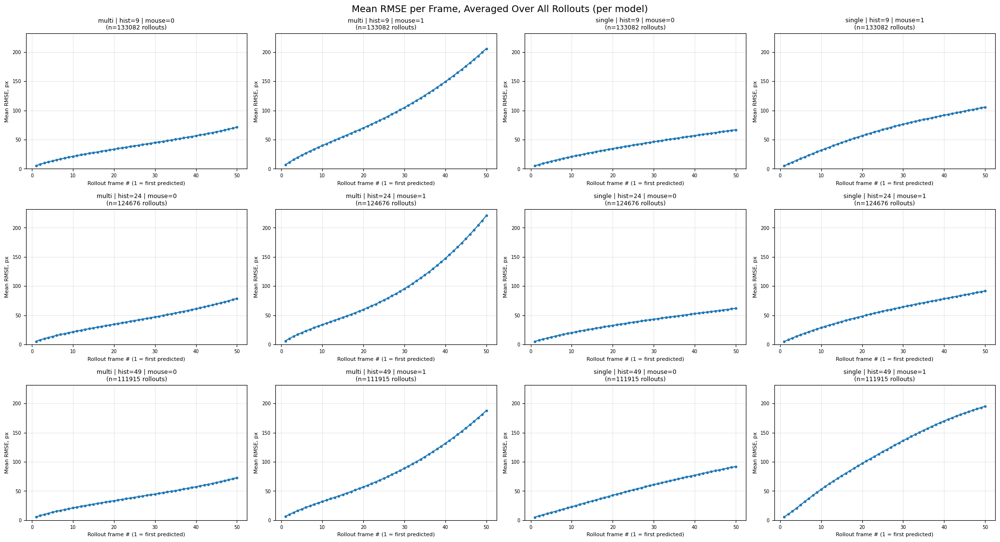

In [5]:
horizon_ymax = finite_max(
    [
        stats["horizon_mean_rmse"]
        for stats in model_stats.values()
        if len(stats["horizon_mean_rmse"]) > 0
    ]
)
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or len(stats["horizon_positions"]) == 0:
        mark_missing(ax, label)
        continue

    x = stats["horizon_positions"] + 1  # 1 = first predicted frame of the rollout
    ax.plot(x, stats["horizon_mean_rmse"], marker="o", markersize=3, linewidth=1.5)
    ax.set_title(f"{label}\n(n={stats['n_rollouts']} rollouts)", fontsize=9)
    ax.set_xlabel("Rollout frame # (1 = first predicted)", fontsize=8)
    ax.set_ylabel("Mean RMSE, px", fontsize=8)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)

apply_shared_ylim(axes, horizon_ymax)
fig.suptitle("Mean RMSE per Frame, Averaged Over All Rollouts (per model)", fontsize=14)
plt.tight_layout()
plt.show()


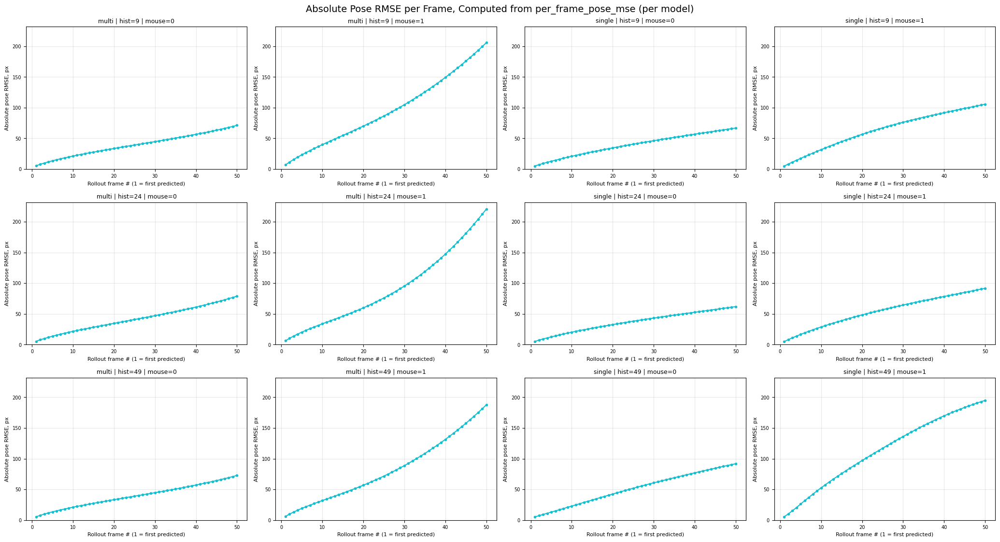

In [6]:
# Absolute-position RMSE per rollout frame, computed during the model_stats pass.
# This block does not read any npz files; it only plots arrays already stored in memory.
absolute_pose_ymax = finite_max(
    [
        stats["absolute_pose_mean_rmse"]
        for stats in model_stats.values()
        if len(stats.get("absolute_pose_mean_rmse", [])) > 0
    ]
)
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    key = (model_name, history_frames, mouse_id)
    label = model_label(model_name, history_frames, mouse_id)
    stats = model_stats.get(key)
    if stats is None or len(stats.get("absolute_pose_positions", [])) == 0:
        mark_missing(ax, label)
        continue

    x = stats["absolute_pose_positions"] + 1
    ax.plot(
        x,
        stats["absolute_pose_mean_rmse"],
        marker="o",
        markersize=3,
        linewidth=1.5,
        color="tab:cyan",
    )
    ax.set_title(label, fontsize=9)
    ax.set_xlabel("Rollout frame # (1 = first predicted)", fontsize=8)
    ax.set_ylabel("Absolute pose RMSE, px", fontsize=8)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)

apply_shared_ylim(axes, absolute_pose_ymax)
fig.suptitle("Absolute Pose RMSE per Frame, Computed from per_frame_pose_mse (per model)", fontsize=14)
plt.tight_layout()
plt.show()


## 2. Average prediction error by joint, by model (12 plots)

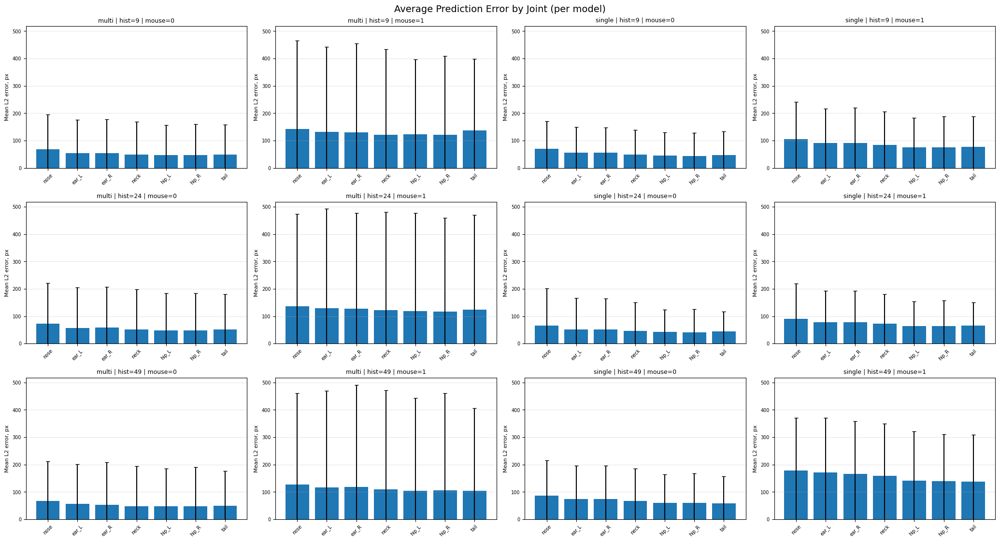

In [18]:
joint_ymax = finite_max(
    [
        stats["joint_mean"] + stats["joint_std"]
        for stats in model_stats.values()
        if len(stats["joint_mean"]) > 0
    ]
)
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None:
        mark_missing(ax, label)
        continue

    ax.bar(JOINT_NAMES, stats["joint_mean"], yerr=stats["joint_std"], capsize=3)
    ax.set_title(label, fontsize=9)
    ax.set_ylabel("Mean L2 error, px", fontsize=8)
    ax.tick_params(axis="x", rotation=45, labelsize=7)
    ax.tick_params(axis="y", labelsize=7)
    ax.grid(axis="y", alpha=0.3)

apply_shared_ylim(axes, joint_ymax)
fig.suptitle("Average Prediction Error by Joint (per model)", fontsize=14)
plt.tight_layout()
plt.show()


## 3. Prediction error by distance, by model (12 plots)

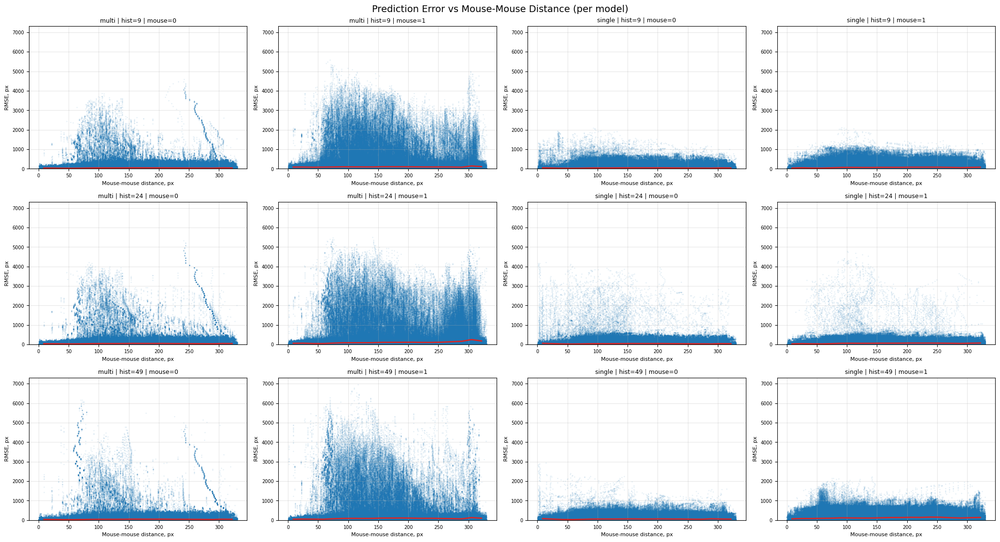

In [19]:
distance_ymax = finite_max(
    [
        stats["distance_rmse"]
        for stats in model_stats.values()
        if len(stats["distance_rmse"]) > 0
    ]
)
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or len(stats["distance"]) == 0:
        mark_missing(ax, label)
        continue

    x, y = stats["distance"], stats["distance_rmse"]
    ax.scatter(x, y, s=3, alpha=0.12, color="tab:blue", linewidths=0, rasterized=True)
    cx, cy = binned_trend(x, y)
    ax.plot(cx, cy, color="tab:red", linewidth=2, label="binned mean")
    ax.set_title(label, fontsize=9)
    ax.set_xlabel("Mouse-mouse distance, px", fontsize=8)
    ax.set_ylabel("RMSE, px", fontsize=8)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)

apply_shared_ylim(axes, distance_ymax)
fig.suptitle("Prediction Error vs Mouse-Mouse Distance (per model)", fontsize=14)
plt.tight_layout()
plt.show()


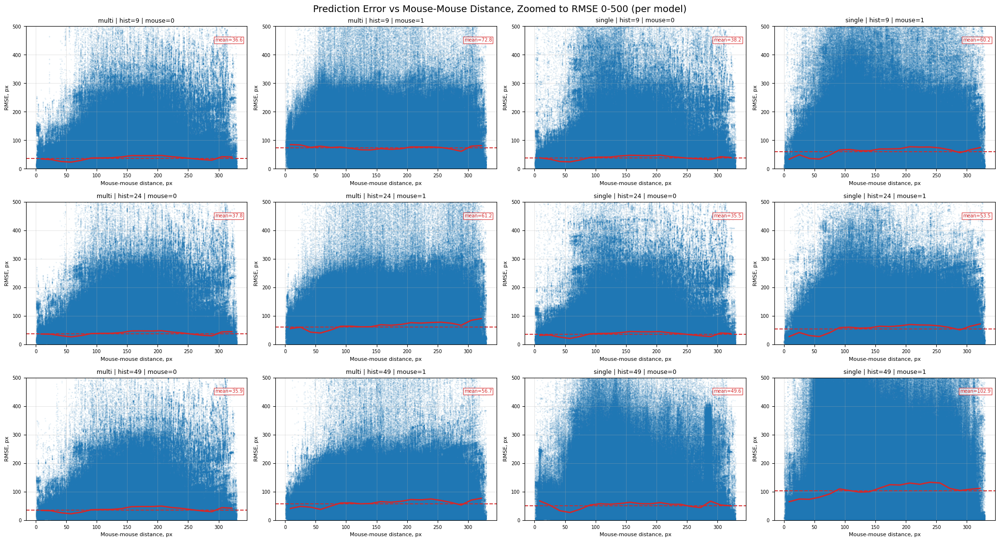

In [20]:
zoom_ymin, zoom_ymax = 0, 500
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or len(stats["distance"]) == 0:
        mark_missing(ax, label)
        continue

    x = np.asarray(stats["distance"], dtype=np.float64)
    y = np.asarray(stats["distance_rmse"], dtype=np.float64)
    visible = np.isfinite(x) & np.isfinite(y) & (y >= zoom_ymin) & (y <= zoom_ymax)
    if not visible.any():
        mark_missing(ax, label)
        continue

    x_visible, y_visible = x[visible], y[visible]
    ax.scatter(x_visible, y_visible, s=3, alpha=0.12, color="tab:blue", linewidths=0, rasterized=True)
    cx, cy = binned_trend(x_visible, y_visible)
    ax.plot(cx, cy, color="tab:red", linewidth=2, label="binned mean")
    draw_visible_mean_line(ax, visible_mean(y, zoom_ymin, zoom_ymax))
    ax.set_title(label, fontsize=9)
    ax.set_xlabel("Mouse-mouse distance, px", fontsize=8)
    ax.set_ylabel("RMSE, px", fontsize=8)
    ax.set_ylim(zoom_ymin, zoom_ymax)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)

fig.suptitle("Prediction Error vs Mouse-Mouse Distance, Zoomed to RMSE 0-500 (per model)", fontsize=14)
plt.tight_layout()
plt.show()


## 4. Prediction error by velocity, by model (12 plots)

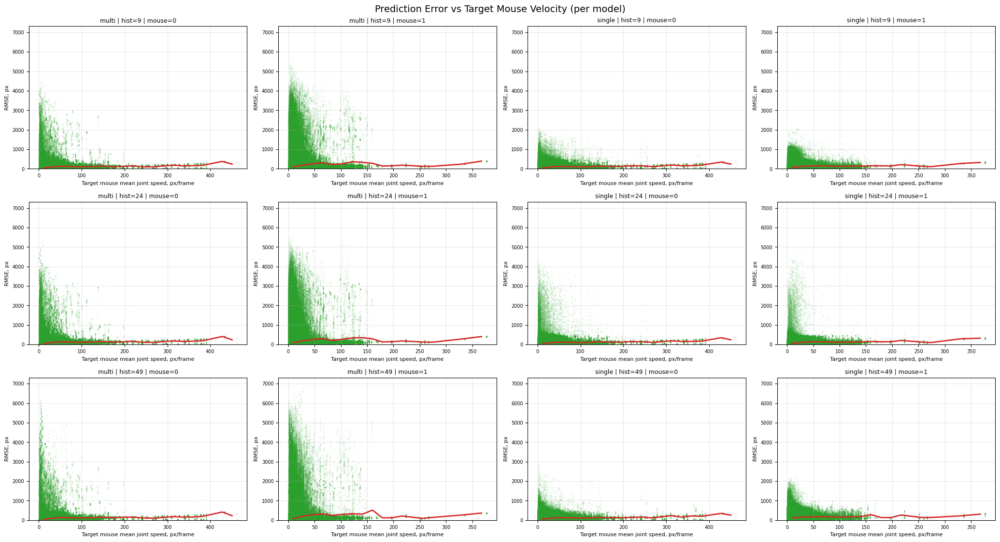

In [10]:
speed_ymax = finite_max(
    [
        stats["speed_rmse"]
        for stats in model_stats.values()
        if len(stats["speed_rmse"]) > 0
    ]
)
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or len(stats["speed"]) == 0:
        mark_missing(ax, label)
        continue

    x, y = stats["speed"], stats["speed_rmse"]
    ax.scatter(x, y, s=3, alpha=0.12, color="tab:green", linewidths=0, rasterized=True)
    cx, cy = binned_trend(x, y)
    ax.plot(cx, cy, color="tab:red", linewidth=2, label="binned mean")
    ax.set_title(label, fontsize=9)
    ax.set_xlabel("Target mouse mean joint speed, px/frame", fontsize=8)
    ax.set_ylabel("RMSE, px", fontsize=8)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)

apply_shared_ylim(axes, speed_ymax)
fig.suptitle("Prediction Error vs Target Mouse Velocity (per model)", fontsize=14)
plt.tight_layout()
plt.show()


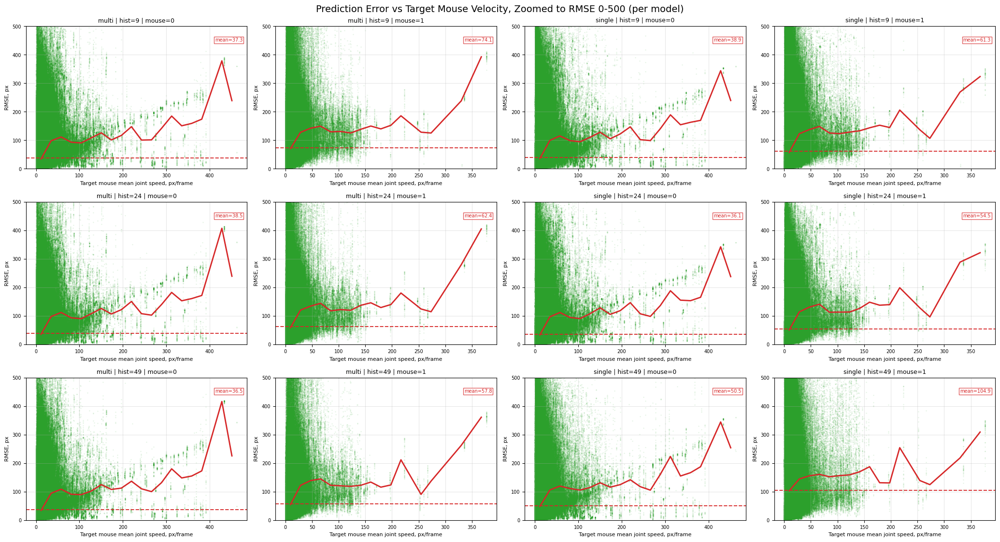

In [11]:
zoom_ymin, zoom_ymax = 0, 500
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or len(stats["speed"]) == 0:
        mark_missing(ax, label)
        continue

    x = np.asarray(stats["speed"], dtype=np.float64)
    y = np.asarray(stats["speed_rmse"], dtype=np.float64)
    visible = np.isfinite(x) & np.isfinite(y) & (y >= zoom_ymin) & (y <= zoom_ymax)
    if not visible.any():
        mark_missing(ax, label)
        continue

    x_visible, y_visible = x[visible], y[visible]
    ax.scatter(x_visible, y_visible, s=3, alpha=0.12, color="tab:green", linewidths=0, rasterized=True)
    cx, cy = binned_trend(x_visible, y_visible)
    ax.plot(cx, cy, color="tab:red", linewidth=2, label="binned mean")
    draw_visible_mean_line(ax, visible_mean(y, zoom_ymin, zoom_ymax))
    ax.set_title(label, fontsize=9)
    ax.set_xlabel("Target mouse mean joint speed, px/frame", fontsize=8)
    ax.set_ylabel("RMSE, px", fontsize=8)
    ax.set_ylim(zoom_ymin, zoom_ymax)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)

fig.suptitle("Prediction Error vs Target Mouse Velocity, Zoomed to RMSE 0-500 (per model)", fontsize=14)
plt.tight_layout()
plt.show()


## 5. Prediction error by acceleration, by model (12 plots)

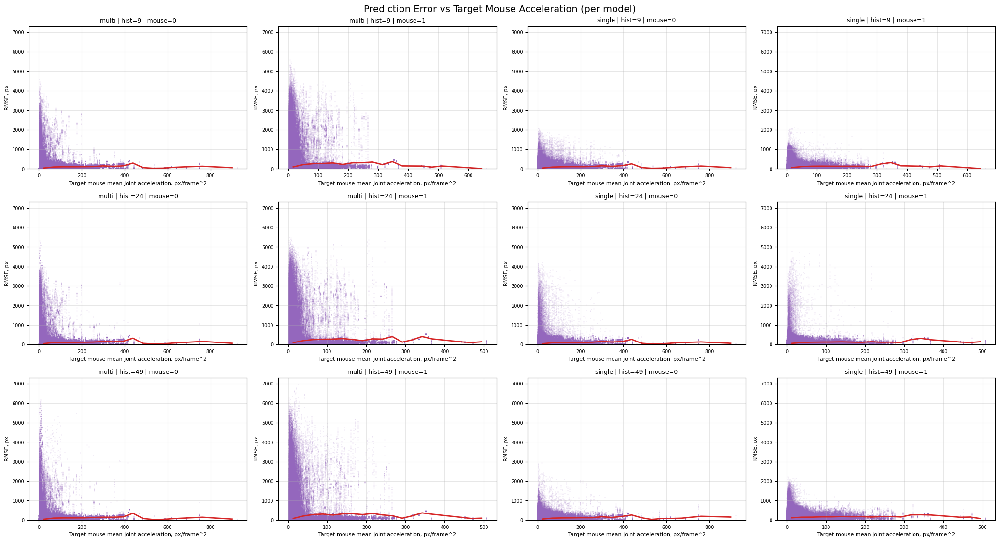

In [12]:
accel_ymax = finite_max(
    [
        stats["accel_rmse"]
        for stats in model_stats.values()
        if len(stats["accel_rmse"]) > 0
    ]
)
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or len(stats["accel"]) == 0:
        mark_missing(ax, label)
        continue

    x, y = stats["accel"], stats["accel_rmse"]
    ax.scatter(x, y, s=3, alpha=0.12, color="tab:purple", linewidths=0, rasterized=True)
    cx, cy = binned_trend(x, y)
    ax.plot(cx, cy, color="tab:red", linewidth=2, label="binned mean")
    ax.set_title(label, fontsize=9)
    ax.set_xlabel("Target mouse mean joint acceleration, px/frame^2", fontsize=8)
    ax.set_ylabel("RMSE, px", fontsize=8)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)

apply_shared_ylim(axes, accel_ymax)
fig.suptitle("Prediction Error vs Target Mouse Acceleration (per model)", fontsize=14)
plt.tight_layout()
plt.show()


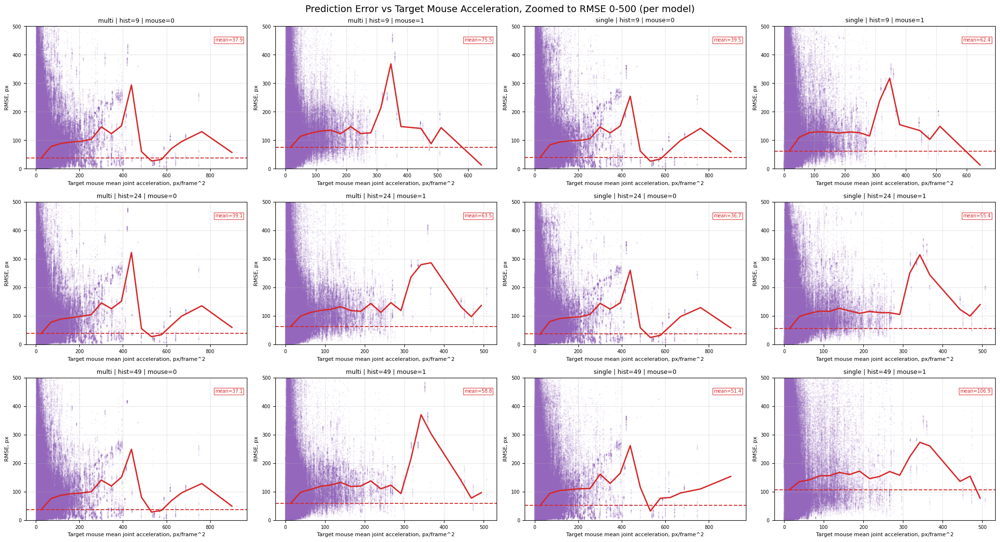

In [13]:
zoom_ymin, zoom_ymax = 0, 500
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or len(stats["accel"]) == 0:
        mark_missing(ax, label)
        continue

    x = np.asarray(stats["accel"], dtype=np.float64)
    y = np.asarray(stats["accel_rmse"], dtype=np.float64)
    visible = np.isfinite(x) & np.isfinite(y) & (y >= zoom_ymin) & (y <= zoom_ymax)
    if not visible.any():
        mark_missing(ax, label)
        continue

    x_visible, y_visible = x[visible], y[visible]
    ax.scatter(x_visible, y_visible, s=3, alpha=0.12, color="tab:purple", linewidths=0, rasterized=True)
    cx, cy = binned_trend(x_visible, y_visible)
    ax.plot(cx, cy, color="tab:red", linewidth=2, label="binned mean")
    draw_visible_mean_line(ax, visible_mean(y, zoom_ymin, zoom_ymax))
    ax.set_title(label, fontsize=9)
    ax.set_xlabel("Target mouse mean joint acceleration, px/frame^2", fontsize=8)
    ax.set_ylabel("RMSE, px", fontsize=8)
    ax.set_ylim(zoom_ymin, zoom_ymax)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)

fig.suptitle("Prediction Error vs Target Mouse Acceleration, Zoomed to RMSE 0-500 (per model)", fontsize=14)
plt.tight_layout()
plt.show()


## 6. Prediction error by behavior class / annotation, by model (12 plots)

/tmp/ipykernel_9267/3827569383.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=labels_sorted, showmeans=True)
/tmp/ipykernel_9267/3827569383.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=labels_sorted, showmeans=True)
/tmp/ipykernel_9267/3827569383.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=labels_sorted, showmeans=True)
/tmp/ipykernel_9267/3827569383.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
 

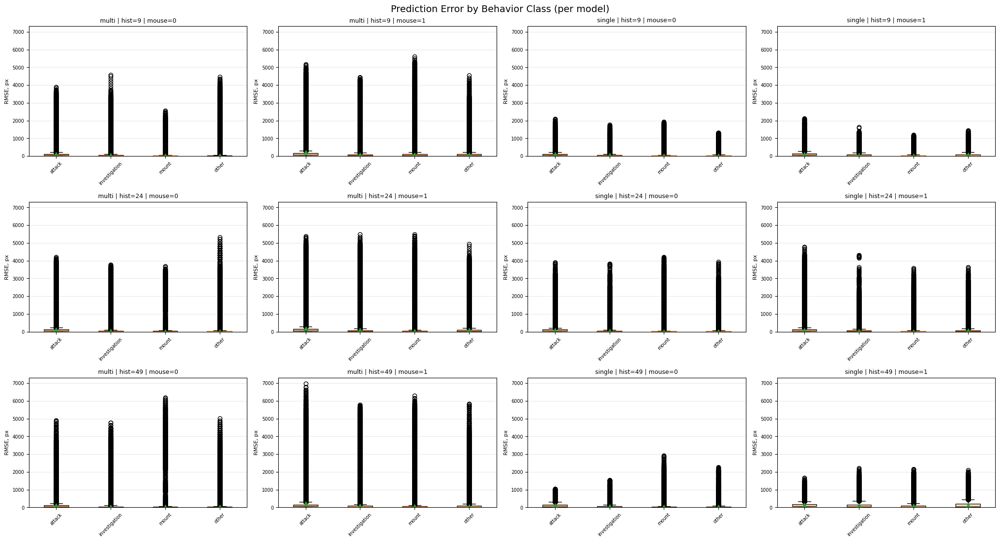

In [14]:
behavior_ymax = finite_max(
    [
        values
        for stats in model_stats.values()
        for values in stats["behavior_rmse"].values()
    ]
)
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or not stats["behavior_rmse"]:
        mark_missing(ax, label)
        continue

    behavior_rmse = stats["behavior_rmse"]
    labels_sorted = sorted(behavior_rmse.keys())
    data = [behavior_rmse[b] for b in labels_sorted]

    ax.boxplot(data, labels=labels_sorted, showmeans=True)
    ax.set_title(label, fontsize=9)
    ax.set_ylabel("RMSE, px", fontsize=8)
    ax.tick_params(axis="x", rotation=45, labelsize=7)
    ax.tick_params(axis="y", labelsize=7)
    ax.grid(axis="y", alpha=0.3)

apply_shared_ylim(axes, behavior_ymax)
fig.suptitle("Prediction Error by Behavior Class (per model)", fontsize=14)
plt.tight_layout()
plt.show()


/tmp/ipykernel_9267/3116470265.py:28: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=visible_labels, showmeans=True)
/tmp/ipykernel_9267/3116470265.py:28: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=visible_labels, showmeans=True)
/tmp/ipykernel_9267/3116470265.py:28: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=visible_labels, showmeans=True)
/tmp/ipykernel_9267/3116470265.py:28: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11

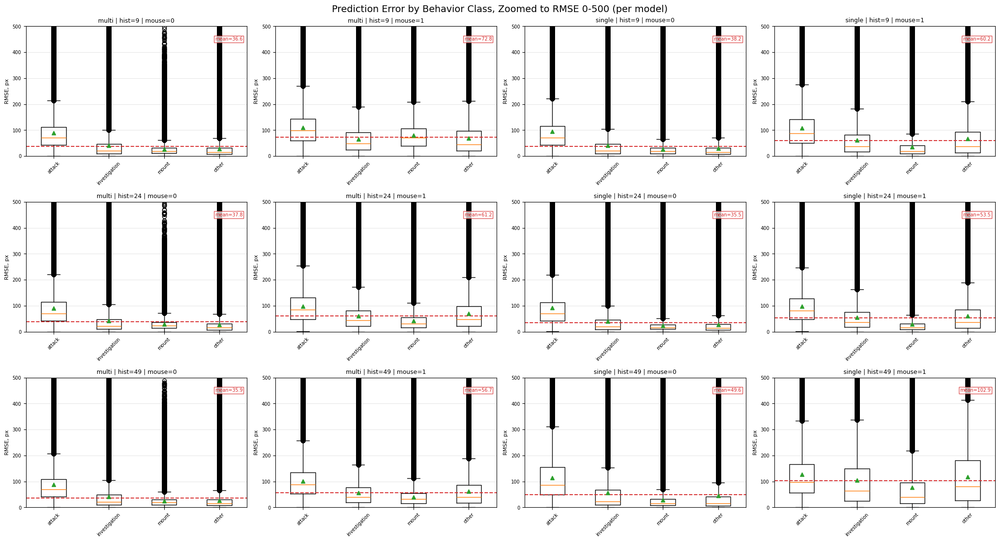

In [15]:
zoom_ymin, zoom_ymax = 0, 500
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or not stats["behavior_rmse"]:
        mark_missing(ax, label)
        continue

    behavior_rmse = stats["behavior_rmse"]
    labels_sorted = sorted(behavior_rmse.keys())
    data = []
    visible_values = []
    visible_labels = []
    for behavior_name in labels_sorted:
        values = np.asarray(behavior_rmse[behavior_name], dtype=np.float64)
        visible = values[np.isfinite(values) & (values >= zoom_ymin) & (values <= zoom_ymax)]
        if visible.size:
            data.append(visible)
            visible_values.append(visible)
            visible_labels.append(behavior_name)

    if not data:
        mark_missing(ax, label)
        continue

    ax.boxplot(data, labels=visible_labels, showmeans=True)
    draw_visible_mean_line(ax, np.concatenate(visible_values).mean())
    ax.set_title(label, fontsize=9)
    ax.set_ylabel("RMSE, px", fontsize=8)
    ax.set_ylim(zoom_ymin, zoom_ymax)
    ax.tick_params(axis="x", rotation=45, labelsize=7)
    ax.tick_params(axis="y", labelsize=7)
    ax.grid(axis="y", alpha=0.3)

fig.suptitle("Prediction Error by Behavior Class, Zoomed to RMSE 0-500 (per model)", fontsize=14)
plt.tight_layout()
plt.show()


## 7. Prediction error by heading angle, by model (12 plots)

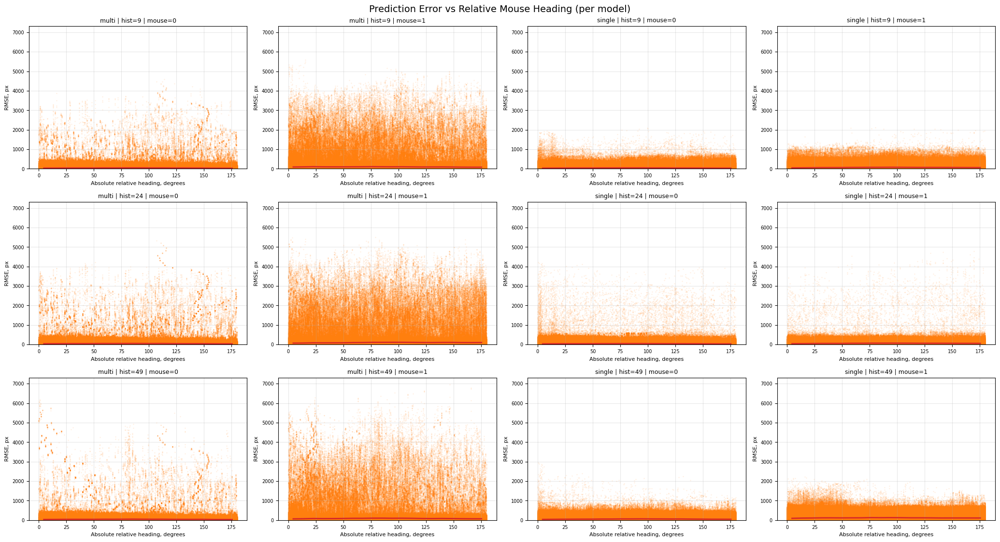

In [16]:
heading_ymax = finite_max(
    [
        stats["heading_rmse"]
        for stats in model_stats.values()
        if len(stats["heading_rmse"]) > 0
    ]
)
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or len(stats["heading"]) == 0:
        mark_missing(ax, label)
        continue

    x, y = stats["heading"], stats["heading_rmse"]
    ax.scatter(x, y, s=3, alpha=0.12, color="tab:orange", linewidths=0, rasterized=True)
    cx, cy = binned_trend(x, y)
    ax.plot(cx, cy, color="tab:red", linewidth=2, label="binned mean")
    ax.set_title(label, fontsize=9)
    ax.set_xlabel("Absolute relative heading, degrees", fontsize=8)
    ax.set_ylabel("RMSE, px", fontsize=8)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)

apply_shared_ylim(axes, heading_ymax)
fig.suptitle("Prediction Error vs Relative Mouse Heading (per model)", fontsize=14)
plt.tight_layout()
plt.show()


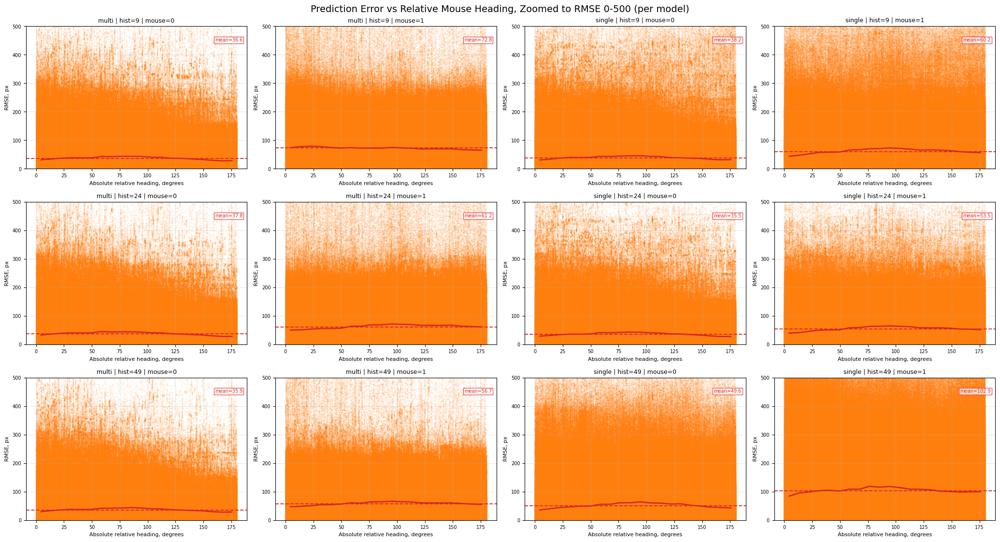

In [17]:
zoom_ymin, zoom_ymax = 0, 500
fig, axes = make_grid(len(rollout_result_paths))

for ax, (model_name, history_frames, mouse_id, path) in zip(axes, rollout_result_paths):
    stats = model_stats.get((model_name, history_frames, mouse_id))
    label = model_label(model_name, history_frames, mouse_id)
    if stats is None or len(stats["heading"]) == 0:
        mark_missing(ax, label)
        continue

    x = np.asarray(stats["heading"], dtype=np.float64)
    y = np.asarray(stats["heading_rmse"], dtype=np.float64)
    visible = np.isfinite(x) & np.isfinite(y) & (y >= zoom_ymin) & (y <= zoom_ymax)
    if not visible.any():
        mark_missing(ax, label)
        continue

    x_visible, y_visible = x[visible], y[visible]
    ax.scatter(x_visible, y_visible, s=3, alpha=0.12, color="tab:orange", linewidths=0, rasterized=True)
    cx, cy = binned_trend(x_visible, y_visible)
    ax.plot(cx, cy, color="tab:red", linewidth=2, label="binned mean")
    draw_visible_mean_line(ax, visible_mean(y, zoom_ymin, zoom_ymax))
    ax.set_title(label, fontsize=9)
    ax.set_xlabel("Absolute relative heading, degrees", fontsize=8)
    ax.set_ylabel("RMSE, px", fontsize=8)
    ax.set_ylim(zoom_ymin, zoom_ymax)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)

fig.suptitle("Prediction Error vs Relative Mouse Heading, Zoomed to RMSE 0-500 (per model)", fontsize=14)
plt.tight_layout()
plt.show()


In [21]:
rmse_alias = rollout["per_frame_rmse"]
rmse_abs = np.sqrt(rollout["per_frame_pose_mse"])

print(np.nanmax(np.abs(rmse_alias - rmse_abs)))
print(rmse_alias[:5])
print(rmse_abs[:5])

0.0
[1.4460278 1.4541502 2.9333904 4.8979454 5.476796 ]
[1.4460278 1.4541502 2.9333904 4.8979454 5.476796 ]
